In [1]:
import numpy as np 
import pandas as pd 
import cv2 as cv 
import tensorflow as tf 
import keras 
from matplotlib import pyplot as plt 
import seaborn as sns  
import sklearn as sk

2024-04-19 20:49:30.650067: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-19 20:49:30.650193: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-19 20:49:30.932279: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
def get_file_path(directory, filename):
    return os.path.join(directory, filename)

Under Water Dark

In [3]:
import os  
folder_path='/kaggle/input/auto-1-encoder/underwater_dark-20240413T144356Z-001/underwater_dark/trainA'

X_values=[]
files=os.listdir(folder_path)
print("Image Data Loading")
for file in files:
    image_path=get_file_path(folder_path,file)
    image_data=cv.imread(image_path)
    X_values.append(image_data)
print("Image data loadimg completed")
       

Image Data Loading
Image data loadimg completed


In [4]:
X_values=np.array(X_values)
X_values.shape

(5550, 256, 256, 3)

Reshaping

In [5]:
X_train=[]
for j in range(len(X_values)):
    value=cv.resize(X_values[j],(224,224))
    X_train.append(value)
X_train=np.array(X_train)
X_train.shape
X_train = X_train.astype('float32') / 255.0

In [6]:
X_train.shape

(5550, 224, 224, 3)

In [7]:
def plot_data(data,names):
    fig, axs = plt.subplots(3, 3, figsize=(8, 8))
    for i in range(3):
        for j in range(3):
            image=data[i*3 + j] 
            image=cv.cvtColor(image,cv.COLOR_BGR2RGB)
            axs[i, j].imshow(image)
            axs[i, j].set_title(f'Image {i*3 + j + 1}')
            axs[i, j].axis('off')

    fig.suptitle(f'Grid of Images of {names}', fontsize=16, weight='bold')
    plt.tight_layout()
    plt.show()

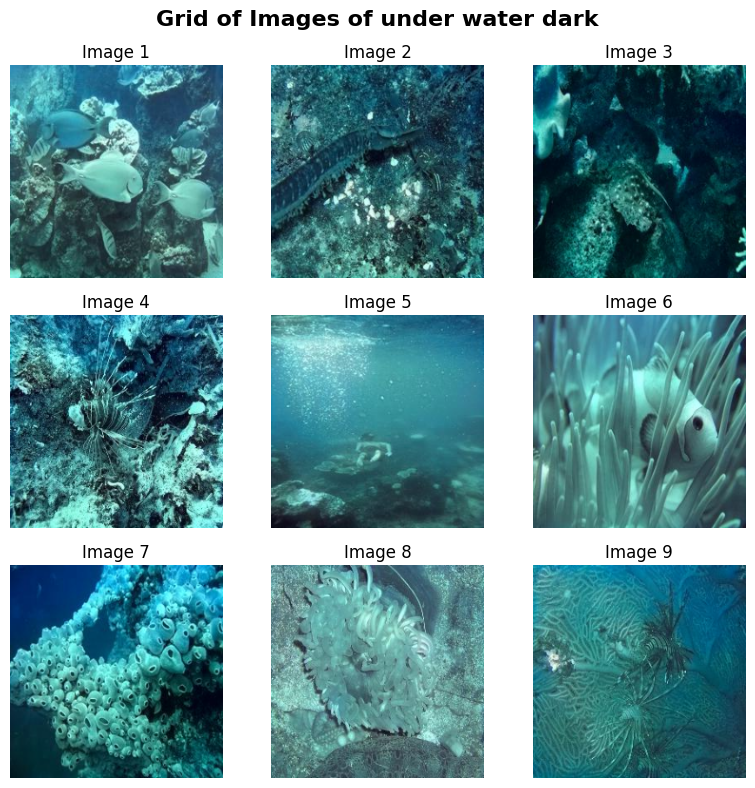

In [8]:
plot_data(X_train,'under water dark')

In [9]:
x_train=X_train[:3000]
x_val=X_train[4000:5000]
x_test=X_train[5000:]

Applying AUto encoder

In [10]:
import tensorflow as tf

def autoencoder():
    # Encoder
    inputs = tf.keras.layers.Input(shape=(224,224,3))
    conv1 = tf.keras.layers.Conv2D(6, kernel_size=(5,5), activation='relu', padding='same')(inputs)
    maxpool1 = tf.keras.layers.MaxPooling2D(pool_size=(2,2), padding='same')(conv1)
    encoder1 = tf.keras.layers.Conv2D(12, kernel_size=(5,5), activation='relu', padding='same')(maxpool1)
    maxpool2 = tf.keras.layers.MaxPooling2D(pool_size=(2,2), padding='same')(encoder1)
    coding = tf.keras.layers.Conv2D(16, kernel_size=(5,5), activation='relu', padding='same')(maxpool2)
    flatten=tf.keras.layers.Conv2D(3, kernel_size=(5,5), activation='relu', padding='same')(coding)
    
    flattening=tf.keras.layers.Flatten()(flatten)
    hidden_1=tf.keras.layers.Dense(9408,activation='relu')(flattening)
    hidden_2=tf.keras.layers.Dense(1000,activation='relu')(hidden_1)

    hidden_3=tf.keras.layers.Dense(500,activation='relu')(hidden_2)

    # Decoder
    hidden_4=tf.keras.layers.Dense(1000,activation='relu')(hidden_3)
    hidden_5=tf.keras.layers.Dense(9408,activation='relu')(hidden_4)
    reshaped=tf.keras.layers.Reshape((56,56,3))(hidden_5)
    decoder2 = tf.keras.layers.Conv2DTranspose(16, kernel_size=(5,5), activation='relu', padding='same')(reshaped)
    upsample1 = tf.keras.layers.UpSampling2D(size=(2, 2))(decoder2)
    decoder1 = tf.keras.layers.Conv2DTranspose(12, kernel_size=(5,5), activation='relu', padding='same')(upsample1)
    upsample2 = tf.keras.layers.UpSampling2D(size=(2, 2))(decoder1)
    upsample3 = tf.keras.layers.Conv2DTranspose(6, kernel_size=(5,5), activation='relu', padding='same')(upsample2)
    outputs = tf.keras.layers.Conv2DTranspose(3, kernel_size=(5,5), activation='relu', padding='same')(upsample3)

    return tf.keras.Model(inputs=inputs, outputs= outputs)

autoencoder_model = autoencoder()


autoencoder_model.compile(optimizer='adam', loss='mse')
autoencoder_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 6)    │           456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 6)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 12)   │         1,812 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 12)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 16)     │         4,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 56, 56, 3)      │         1,203 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 9408)           │    88,519,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1000)           │     9,409,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 500)            │       500,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1000)           │       501,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 9408)           │     9,417,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 56, 56, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 56, 56, 16)     │         1,216 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 112, 112, 12)   │         4,812 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 224, 224, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 224, 224, 6)    │         1,806 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 224, 224, 3)    │           453 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 108,364,354 (413.38 MB)

 Trainable params: 108,364,354 (413.38 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
def calculate_mse(image1, image2):

    if image1.shape != image2.shape:
        raise ValueError("Images must have the same dimensions")
    squared_diff = (image1.astype(np.float32) - image2.astype(np.float32)) ** 2
    mse = np.mean(squared_diff)
    return mse

def total(x_train,decoded_images):
    loss=0
    for i,j in zip(x_train,decoded_images):
        loss+=calculate_mse(i,j)
    total_mse=loss/len(x_train)
    return total_mse 

def psnr(image1, image2):
    mse_value = calculate_mse(image1, image2)
    if mse_value == 0:
        return float('inf')
    
    max_pixel_value=255
    return 20 * np.log10(max_pixel_value / np.sqrt(mse_value))

def quality(x_train,decoded_images):
    total_quality=0 
    for i,j in zip(x_train,decoded_images):
        total_quality+=psnr(i,j)
    total_quality=total_quality/len(x_train)
    return total_quality 
    


In [12]:
def plots_loss(model_his):
    plt.figure(figsize=(14, 6))

    plt.subplot(2, 2, 2)
    plt.plot(model_his.history['loss'])
    plt.plot(model_his.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.show()


In [13]:
tf.config.list_physical_devices('GPU')


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

In [14]:
autoencoder_history=autoencoder_model.fit(x_train,x_train,batch_size=32, epochs=50,validation_data=(x_val,x_val))

Epoch 1/50
 1/94 ━━━━━━━━━━━━━━━━━━━━ 31:55 21s/step - loss: 0.2475

I0000 00:00:1713559887.162817      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713559887.183597      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713559887.188047      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - loss: 0.1689

W0000 00:00:1713559906.423524      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713559906.428376      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713559910.151308      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


94/94 ━━━━━━━━━━━━━━━━━━━━ 48s 296ms/step - loss: 0.1682 - val_loss: 0.0460
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.0452 - val_loss: 0.0434
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.0427 - val_loss: 0.0416
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.0414 - val_loss: 0.0411
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.0392 - val_loss: 0.0372
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.0355 - val_loss: 0.0342
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.0332 - val_loss: 0.0335
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.0325 - val_loss: 0.0315
Epoch 9/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.0306 - val_loss: 0.0305
Epoch 10/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.0300 - val_loss: 0.0303
Epoch 11/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0298 - val_loss: 0.0301
Epoch 12/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.0294 - val

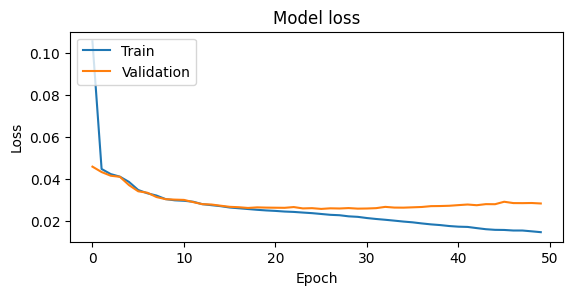

In [15]:
plots_loss(autoencoder_history)

 7/94 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step

W0000 00:00:1713560340.707144      73 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step


W0000 00:00:1713560342.830850      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


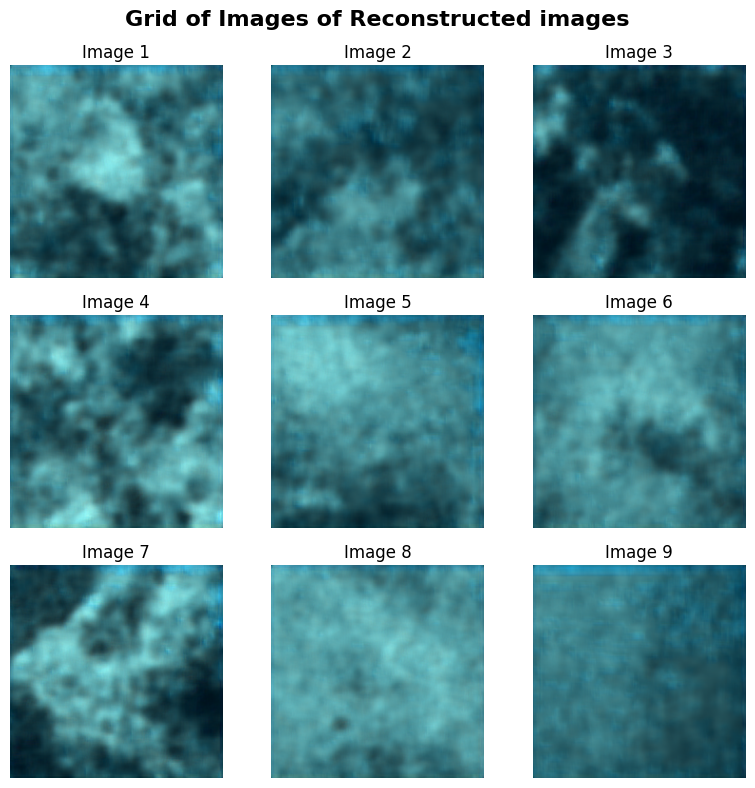

In [16]:
def all_after(model,x_train):
    decoded_images=model.predict(x_train)
    plot_data(decoded_images,names='Reconstructed images')
    return decoded_images

same_train_re=all_after(autoencoder_model,x_train)
    
    

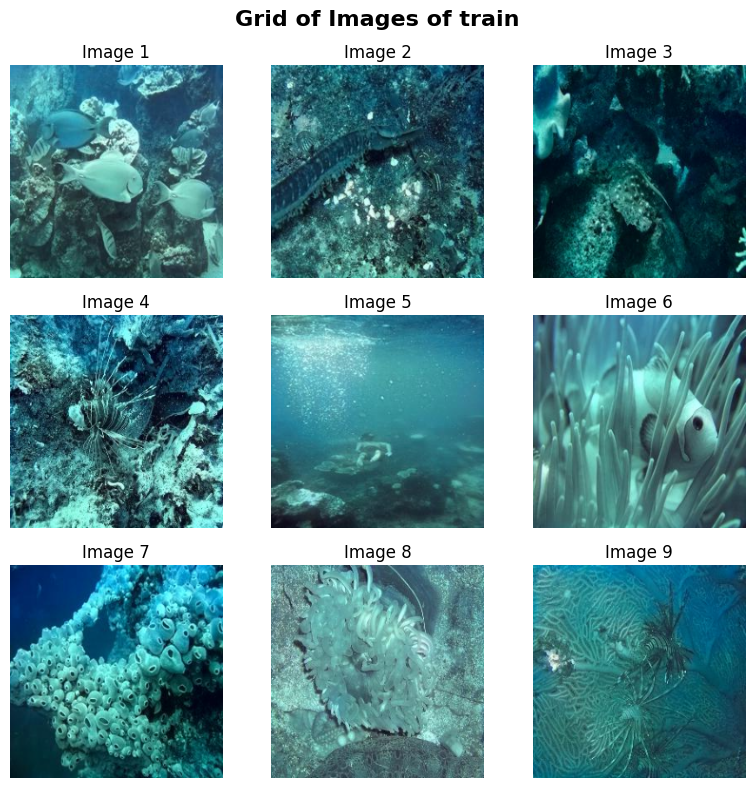

In [17]:
plot_data(x_train,names='train')

18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step


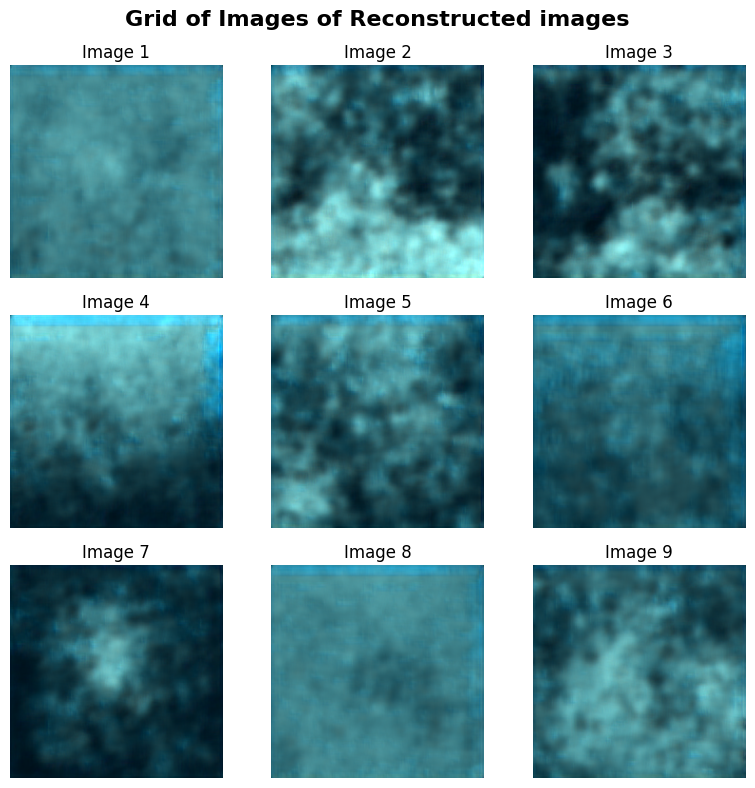

In [18]:
same_test_re=all_after(autoencoder_model,x_test)

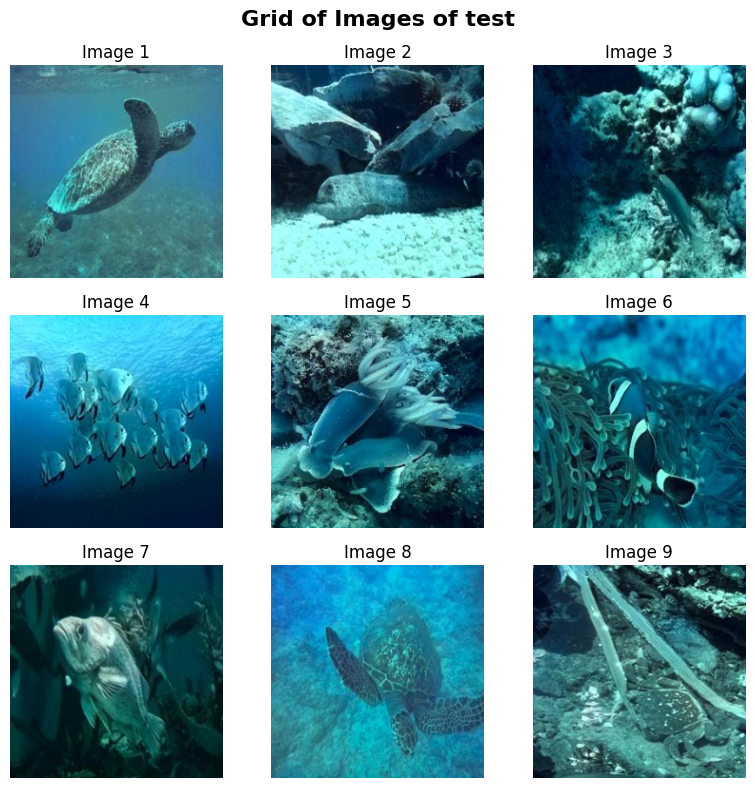

In [19]:
plot_data(x_test,names='test')

In [20]:
print("Average quality of reconstructed images(train):",quality(x_train,same_train_re))
print("Average quality of reconstructed images(test):",quality(x_test,same_test_re))

Average quality of reconstructed images(train): 66.93795798886552
Average quality of reconstructed images(test): 64.00191132895868


In [21]:
print("Average error of reconstructed images(train):",total(x_train,same_train_re))
print("Average error of reconstructed images(test):",total(x_test,same_test_re))

Average error of reconstructed images(train): 0.01422562463193511
Average error of reconstructed images(test): 0.028531986956738614


In [22]:
print(same_train_re.shape)

(3000, 224, 224, 3)


Imagenet Data

In [23]:

import os  
folder_path='/kaggle/input/auto-1-encoder/underwater_imagenet-20240413T154946Z-001/underwater_imagenet/trainA'

X_values=[]
files=os.listdir(folder_path)
print("Image Data Loading")
for file in files:
    image_path=get_file_path(folder_path,file)
    image_data=cv.imread(image_path)
    X_values.append(image_data)
print("Image data loadimg completed")
       

Image Data Loading
Image data loadimg completed


In [24]:
X_values=np.array(X_values)
X_values.shape

(3700, 256, 256, 3)

In [25]:
X_train=[]
for j in range(len(X_values)):
    value=cv.resize(X_values[j],(224,224))
    X_train.append(value)
X_train=np.array(X_train)
X_train.shape
X_train = X_train.astype('float32') / 255.0

In [26]:
X_train.shape

(3700, 224, 224, 3)

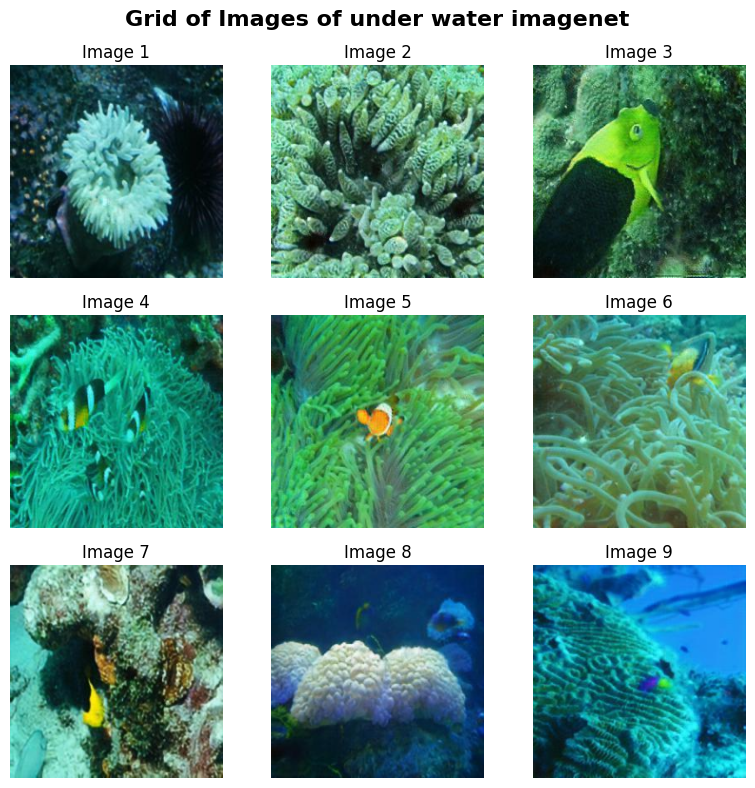

In [27]:
plot_data(X_train,'under water imagenet')

In [28]:
x_train_img=X_train[:2500]
x_val_img=X_train[2500:3000]
x_tes_imgt=X_train[3000:]

In [29]:
autoencoder_history_imagenet=autoencoder_model.fit(x_train_img,x_train_img,batch_size=32, epochs=50,validation_data=(x_val_img,x_val_img))

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0311

W0000 00:00:1713560442.437517      76 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/79 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - loss: 0.0310 - val_loss: 0.0290
Epoch 2/50
 1/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0269

W0000 00:00:1713560449.234464      73 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.0280 - val_loss: 0.0276
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0263 - val_loss: 0.0280
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0254 - val_loss: 0.0260
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0228 - val_loss: 0.0251
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0214 - val_loss: 0.0247
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0205 - val_loss: 0.0246
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0192 - val_loss: 0.0259
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0189 - val_loss: 0.0251
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0174 - val_loss: 0.0250
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0173 - val_loss: 0.0252
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0161 - val_loss: 0.0257
Epoch 13/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0156 - val_

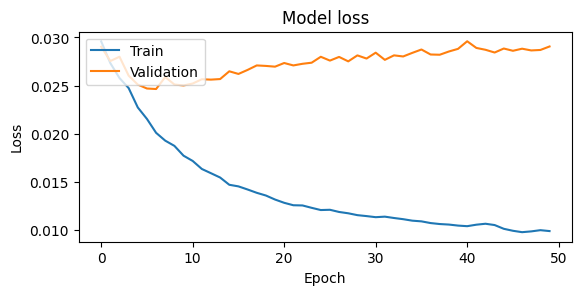

In [30]:
plots_loss(autoencoder_history_imagenet)

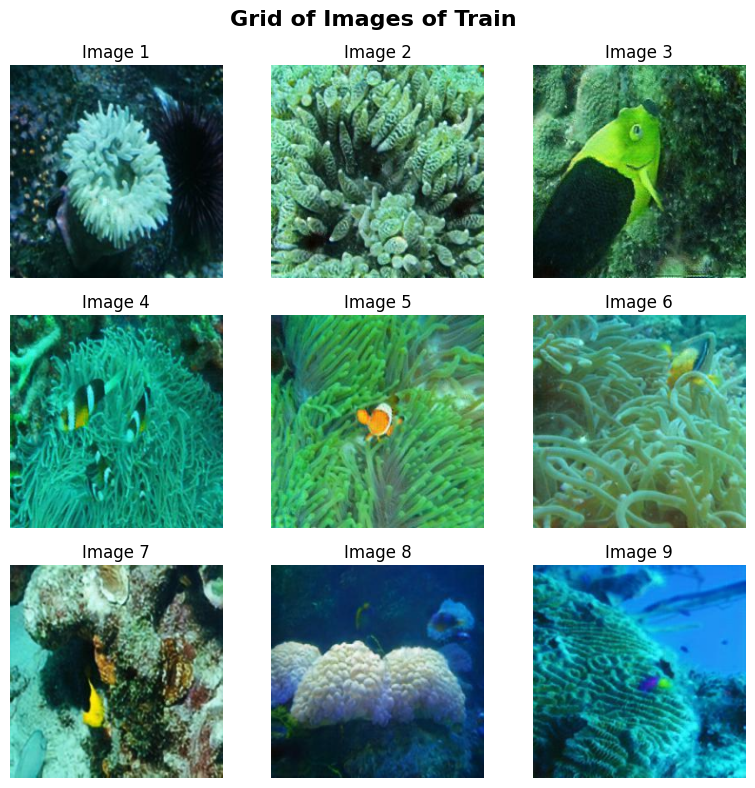

In [31]:
plot_data(x_train_img,'Train ')

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step


W0000 00:00:1713560796.155418      73 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


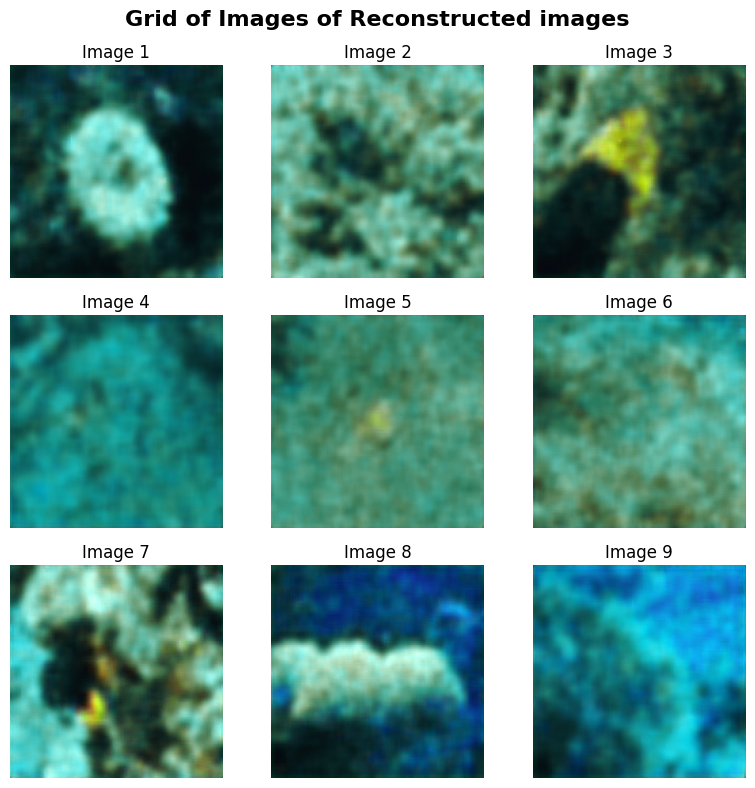

In [32]:
same_train=all_after(autoencoder_model,x_train_img)

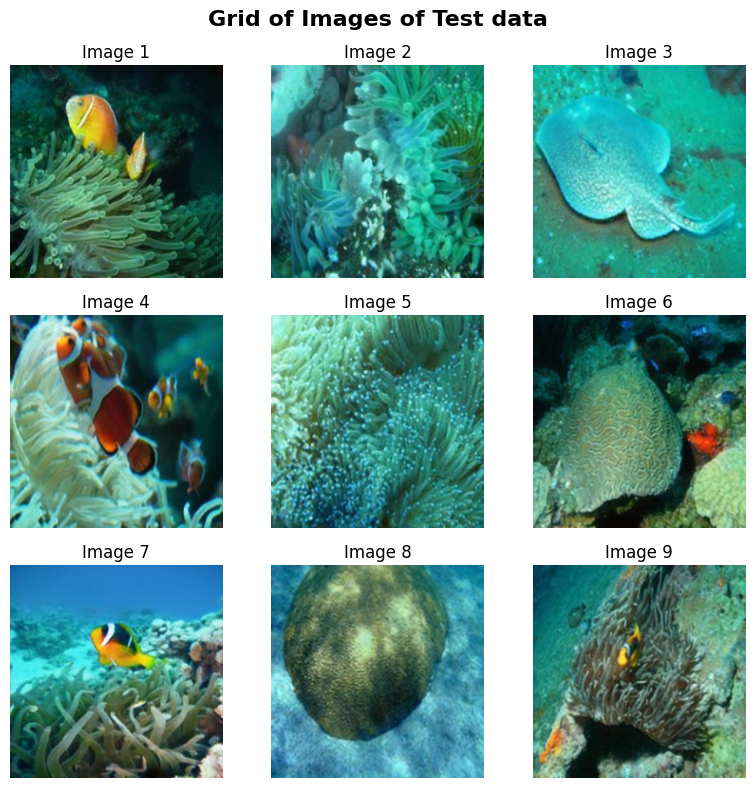

In [33]:
plot_data(x_tes_imgt,names='Test data')

22/22 ━━━━━━━━━━━━━━━━━━━━ 6s 264ms/step


W0000 00:00:1713560810.401249      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


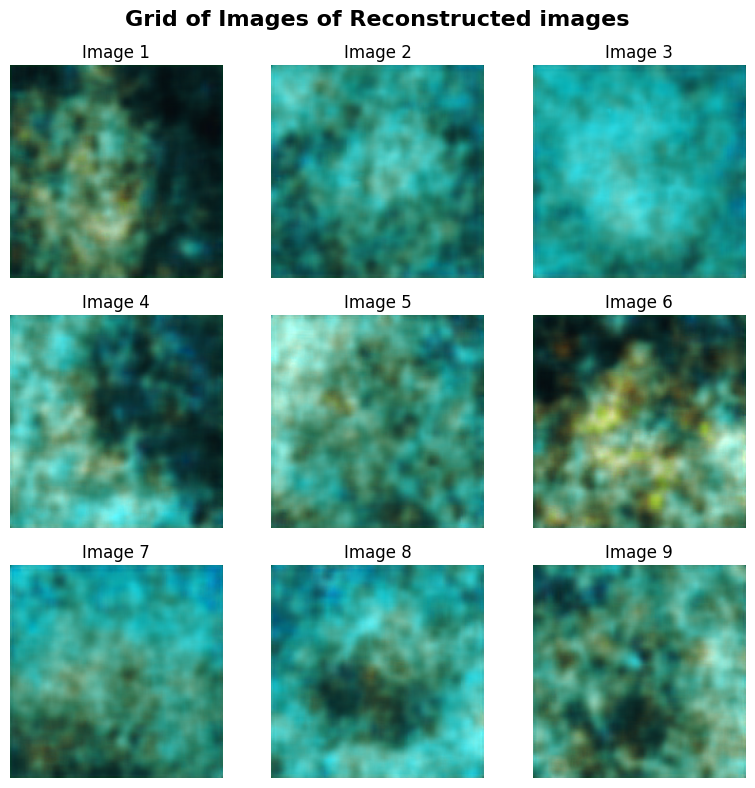

In [34]:
same_test=all_after(autoencoder_model,x_tes_imgt)

In [35]:
print("Average quality of reconstructed images(train):",quality(x_train_img,same_train))
print("Average quality of reconstructed images(test):",quality(x_tes_imgt,same_test))

Average quality of reconstructed images(train): 68.56140141521848
Average quality of reconstructed images(test): 63.864501818439116


In [36]:
print("Average error of reconstructed images(train):",total(x_train_img,same_train))
print("Average error of reconstructed images(test):",total(x_tes_imgt,same_test))

Average error of reconstructed images(train): 0.009883562921639532
Average error of reconstructed images(test): 0.02900182109392647


**Under Water Scenes**

In [37]:
import os  
folder_path='/kaggle/input/auto-1-encoder/underwater_scenes-20240413T151811Z-001/underwater_scenes/trainA'

X_values=[]
files=os.listdir(folder_path)
print("Image Data Loading")
for file in files:
    image_path=get_file_path(folder_path,file)
    image_data=cv.imread(image_path)
    X_values.append(image_data)
print("Image data loadimg completed")

Image Data Loading
Image data loadimg completed


In [38]:
X_values=np.array(X_values)
X_values.shape

(2185, 240, 320, 3)

In [39]:
X_train=[]
for j in range(len(X_values)):
    value=cv.resize(X_values[j],(224,224))
    X_train.append(value)
X_train=np.array(X_train)
X_train.shape
X_train = X_train.astype('float32') / 255.0

In [40]:
X_train.shape

(2185, 224, 224, 3)

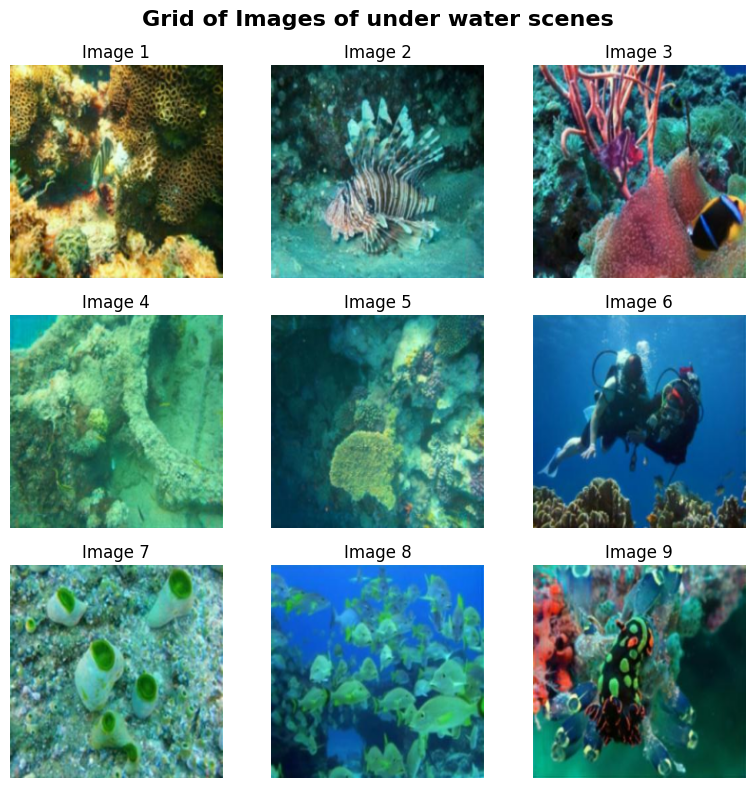

In [41]:
plot_data(X_train,'under water scenes')

In [42]:
x_train_sce=X_train[:1500]
x_val_sce=X_train[1500:1800]
x_test_sce=X_train[1800:]

In [43]:
autoencoder_history_scenes=autoencoder_model.fit(x_train_sce,x_train_sce,batch_size=32, epochs=50,validation_data=(x_val_sce,x_val_sce))

Epoch 1/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0259

W0000 00:00:1713560870.351230      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713560870.359523      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


47/47 ━━━━━━━━━━━━━━━━━━━━ 17s 374ms/step - loss: 0.0259 - val_loss: 0.0232
Epoch 2/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0215 - val_loss: 0.0222
Epoch 3/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.0194 - val_loss: 0.0223
Epoch 4/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.0182 - val_loss: 0.0218
Epoch 5/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.0169 - val_loss: 0.0218
Epoch 6/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.0160 - val_loss: 0.0220
Epoch 7/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.0153 - val_loss: 0.0224
Epoch 8/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0146 - val_loss: 0.0228
Epoch 9/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0140 - val_loss: 0.0230
Epoch 10/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0135 - val_loss: 0.0229
Epoch 11/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0127 - val_loss: 0.0230
Epoch 12/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0123 - val

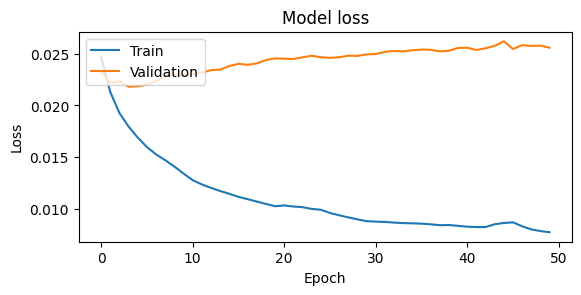

In [44]:
plots_loss(autoencoder_history_scenes)

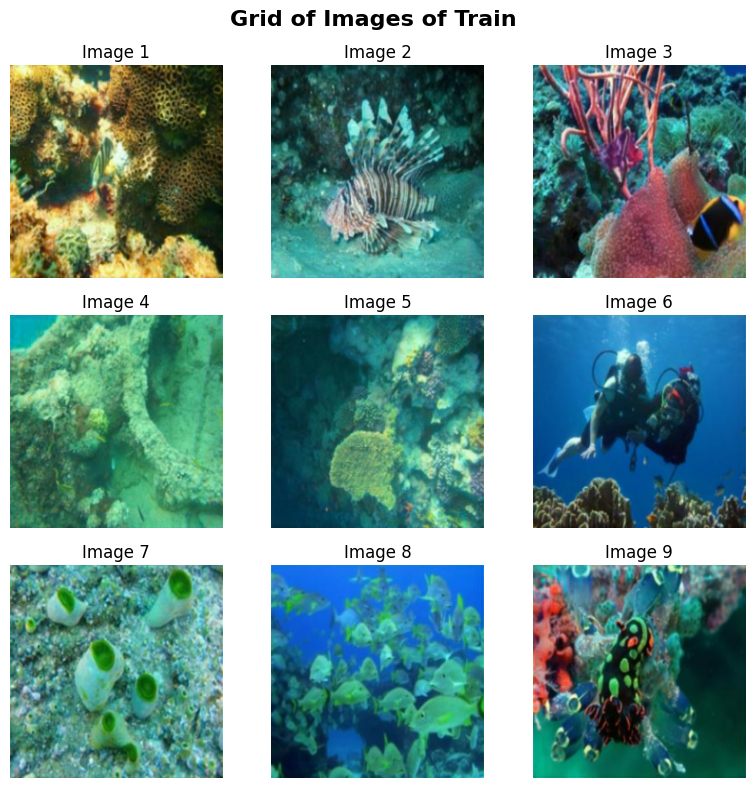

In [45]:
plot_data(x_train_sce,'Train ')

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


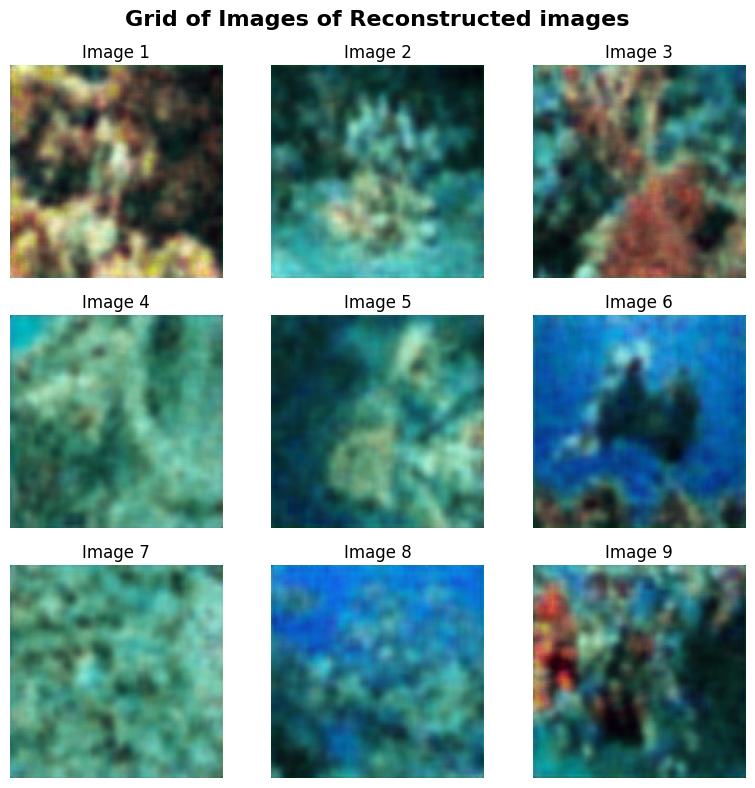

In [46]:
scene_train=all_after(autoencoder_model,x_train_sce)


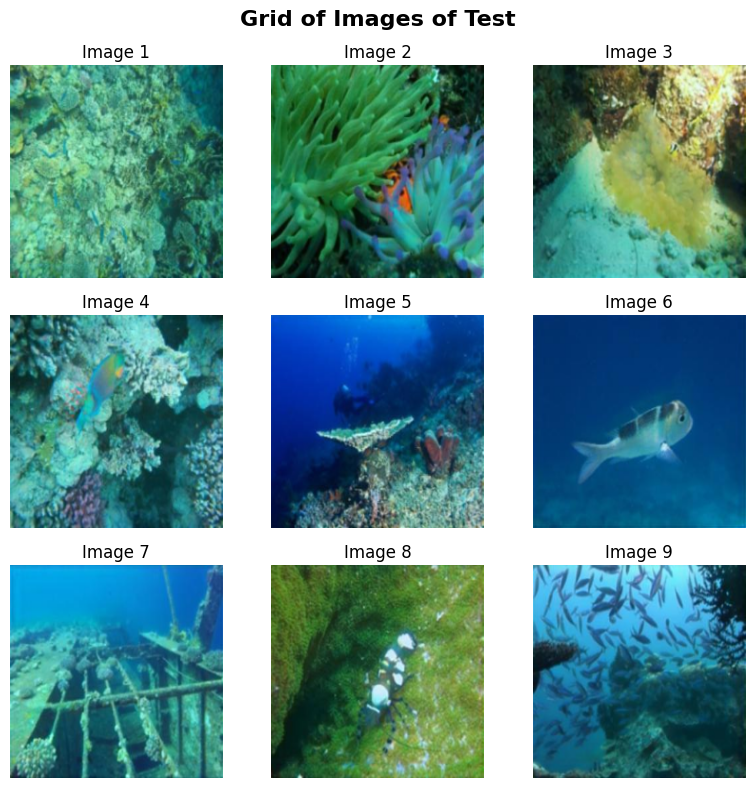

In [47]:
plot_data(x_test_sce,'Test')

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step


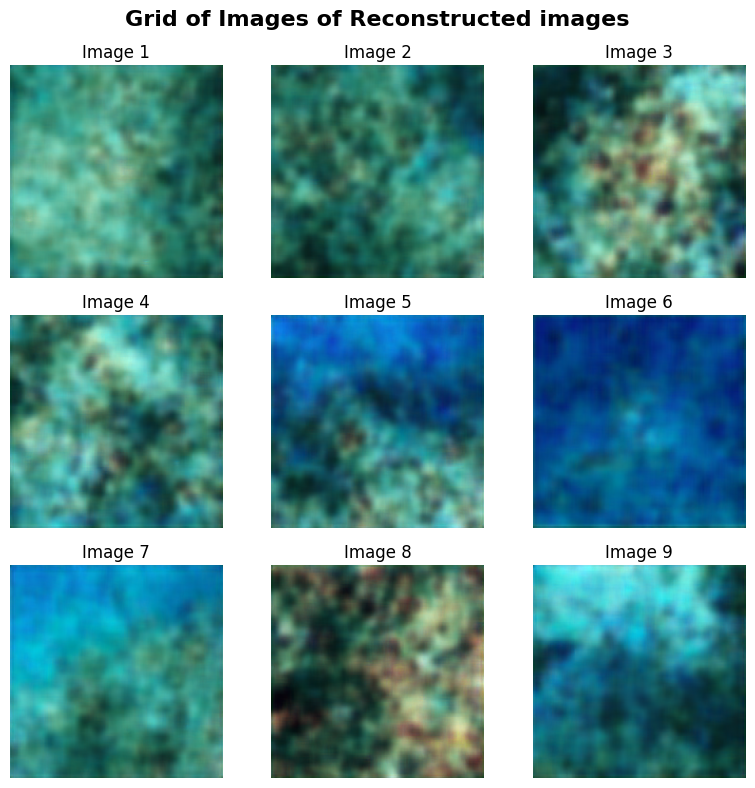

In [48]:
scene_test=all_after(autoencoder_model,x_test_sce)

In [49]:
print("Average quality of reconstructed images(train):",quality(x_train_sce,scene_train))
print("Average quality of reconstructed images(test):",quality(x_test_sce,scene_test))

Average quality of reconstructed images(train): 69.78533311944749
Average quality of reconstructed images(test): 64.70342154717405


In [50]:
print("Average error of reconstructed images(train):",total(x_train_sce,scene_train))
print("Average error of reconstructed images(test):",total(x_test_sce,scene_test))

Average error of reconstructed images(train): 0.007546064129797742
Average error of reconstructed images(test): 0.02432069874961268
